In [1]:
import sys, os
sys.path.append('..')

import matplotlib.pyplot as plt
from src.drone_em_dl import *
initi()

cmap_latent = matplotlib.colors.LinearSegmentedColormap.from_list("", [(0,'#030F4F'), (0.5, '#DADADA'), (1,'#990000')])
cmap_latent2 = matplotlib.colors.LinearSegmentedColormap.from_list("", [(0.0, '#DADADA') ,(0.25, '#990000'),(0.5,'#F6D04D'),(0.75,'#008835'), (1,'#030F4F')])

In [2]:
data = Data()
data.load_data('../data/raw/falster_data_Kristian.csv')
data.get_features([11,12,13,22,23,24,25,26,27,28,29,30,31]) #[1,2,3,4,5,6,7,8,9,10,11,12,13,14]  #[1,2,3,4,5,6,7,11,12,13,14,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31]
data.train_test_split(split=0.8)
data.norm_data()

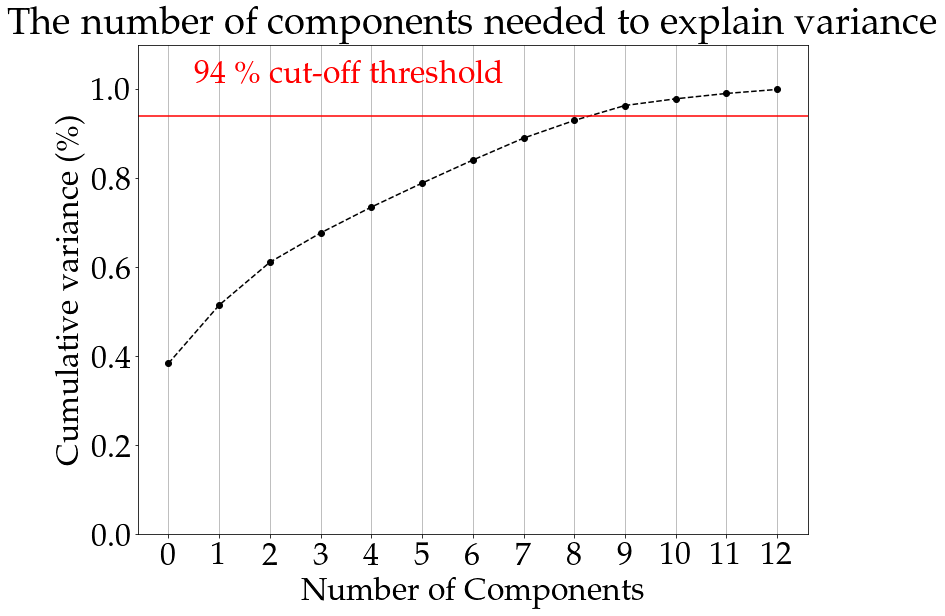

In [3]:
pcas = Pca()
pcas.load_data(data.norm_data.norm_train,data.norm_data.norm_test)
pcas.plot_pc_explained_var(explained_var=0.94)

In [4]:
pcas.get_pca(pca_amount=8)

In [5]:
pcas.plot_pcs()

In [6]:
train_pcs = data.get_inv(pcas.pca_train_inv)
test_pcs = data.get_inv(pcas.pca_test_inv)
true_test = data.get_inv(data.norm_data.norm_test)

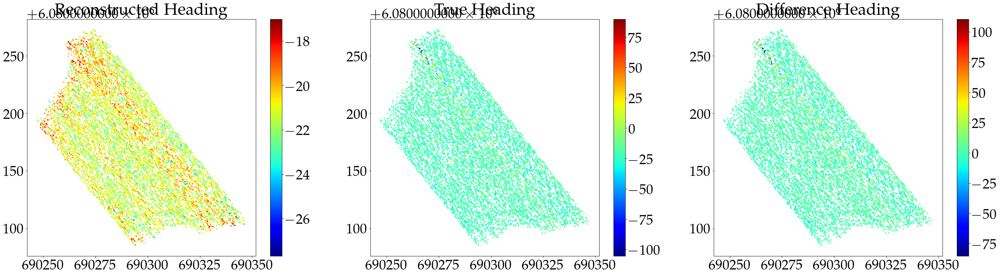

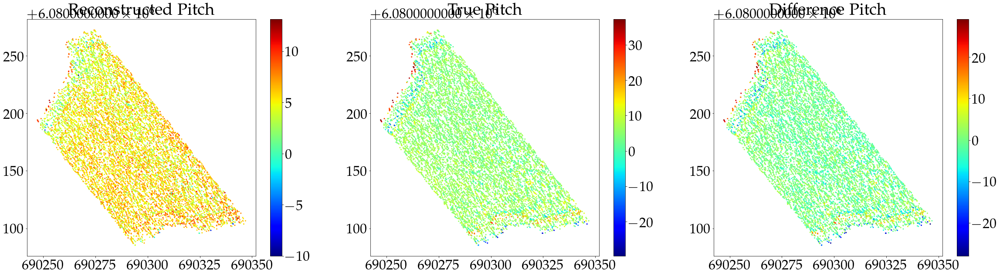

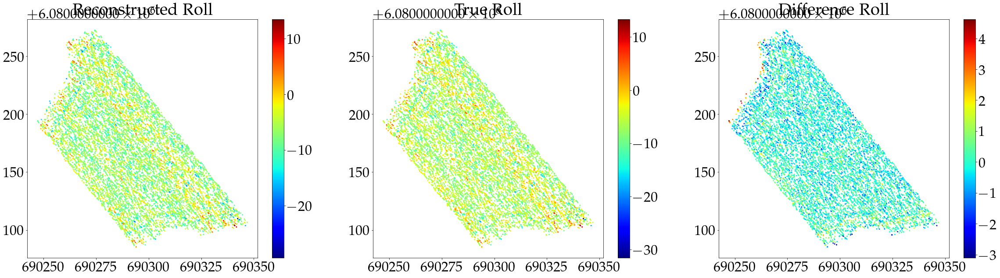

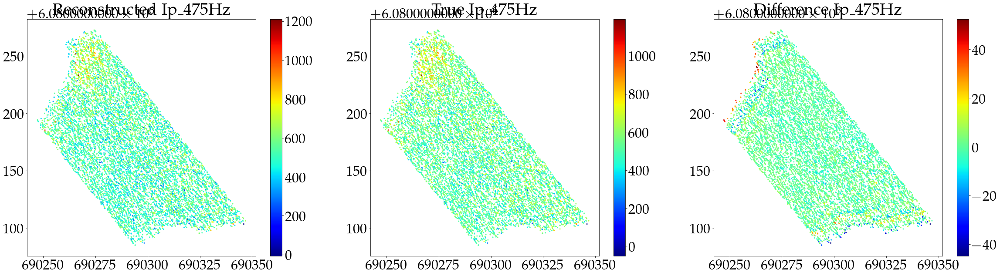

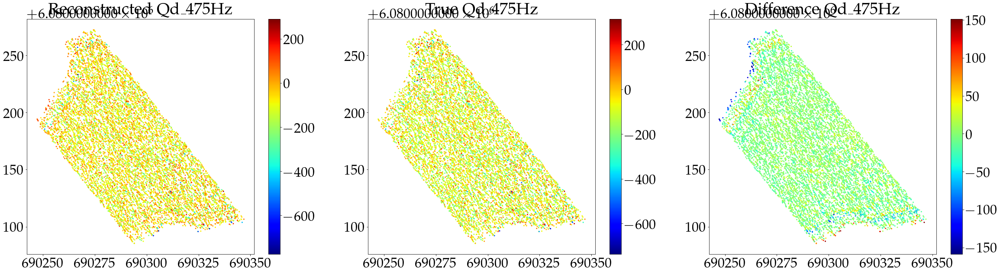

...

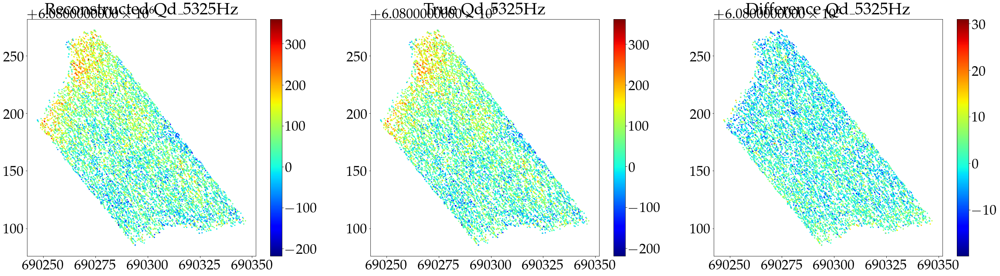

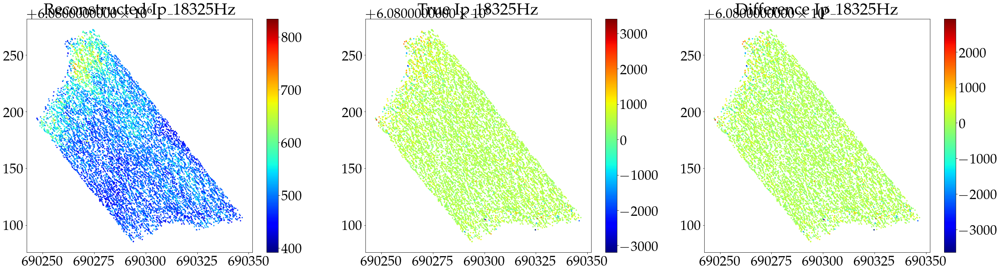

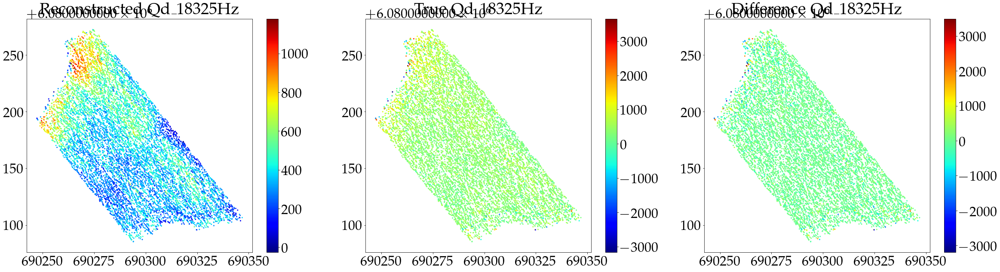

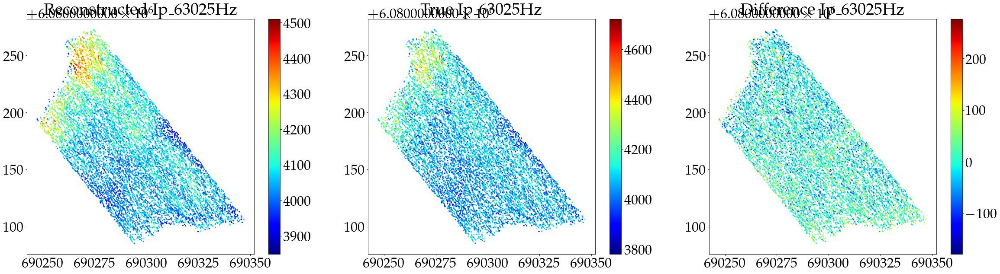

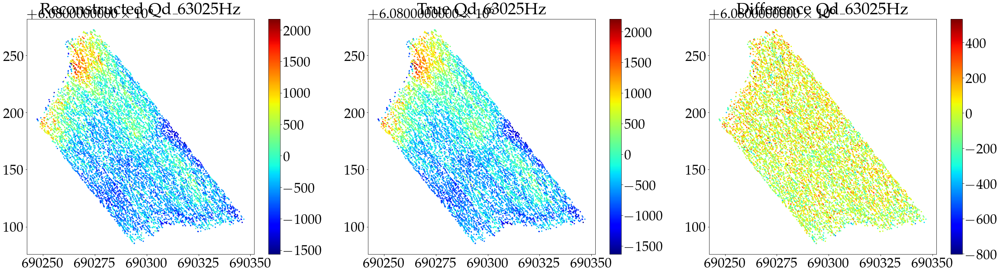

In [7]:
for i in range(13):
    plt.figure(figsize=(40,10))
    plt.subplot(1,3,1)
    plt.title(f'Reconstructed {data.test.columns[i]}')
    cm = plt.scatter(data.org_test.X,data.org_test.Y,c=test_pcs[:,i],cmap='jet',s=4)
    plt.colorbar()

    plt.subplot(1,3,2)
    plt.title(f'True {data.test.columns[i]}')
    cm = plt.scatter(data.org_test.X,data.org_test.Y,c=true_test[:,i],cmap='jet',s=4)
    plt.colorbar()

    plt.subplot(1,3,3)
    plt.title(f'Difference {data.test.columns[i]}')
    cm = plt.scatter(data.org_test.X,data.org_test.Y,c=true_test[:,i]-test_pcs[:,i],cmap='jet',s=4)
    plt.colorbar()
    plt.show()